# Explainable CNN

### Dependencies

In [ ]:
! pip install torchinfo
! pip install gdown  # download large file from Google Drive

In [ ]:
import os
import shutil
import glob
import random
import concurrent
import zipfile
import torch
import PIL
import numpy as np
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, random_split, Dataset
from IPython.display import Image
from torchinfo import summary

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## Get data

Download and prepare the dog & cat dataset:

In [ ]:
! gdown https://drive.google.com/uc?id=1ItGv65UmiQKnett7vxY1qNPTXRg4hSfW

Downloading...
From: https://drive.google.com/uc?id=1ItGv65UmiQKnett7vxY1qNPTXRg4hSfW
To: /content/dog_cat.zip
100% 570M/570M [00:06<00:00, 94.4MB/s]


In [ ]:
with zipfile.ZipFile('/content/dog_cat.zip', 'r') as zip_ref:
    zip_ref.extractall('./')

# cwd
cwd = os.getcwd()

# dirs
dog_cat_dir = os.path.join(cwd, 'dog_cat')
if not os.path.exists(dog_cat_dir):
    os.mkdir(dog_cat_dir)

cat_dir = os.path.join(dog_cat_dir, 'cat')
if not os.path.exists(cat_dir):
    os.mkdir(cat_dir)
    
dog_dir = os.path.join(dog_cat_dir, 'dog')
if not os.path.exists(dog_dir):
    os.mkdir(dog_dir)

# sample random 1000 pics for cats & dogs
cat_pics = np.random.choice(glob.glob(os.path.join(cwd, 'train', 'cat.*.jpg')), size=1000, replace=False)
dog_pics = np.random.choice(glob.glob(os.path.join(cwd, 'train', 'dog.*.jpg')), size=1000, replace=False)

# move to dir
def move_to_folder(scr_file, des_folder):
    des_name = os.path.basename(scr_file)
    shutil.copyfile(scr_file, os.path.join(des_folder, des_name))
# cats
with concurrent.futures.ThreadPoolExecutor(max_workers=4) as pool:
    [pool.submit(move_to_folder, file_name, cat_dir) for file_name in cat_pics]
# dogs
with concurrent.futures.ThreadPoolExecutor(max_workers=4) as pool:
    [pool.submit(move_to_folder, file_name, dog_dir) for file_name in dog_pics]

# dataset
class ImgDataset(Dataset):
    def __init__(self, img_path, img_labels, img_transforms=None):
        self.img_path = img_path
        self.img_labels = torch.Tensor(img_labels)
        if img_transforms is None:
            self.transforms = transforms.ToTensor()
        else:
            self.transforms = img_transforms
    
    def __getitem__(self, index):
        # load image
        cur_path = self.img_path[index]
        cur_img = PIL.Image.open(cur_path)
        cur_img = self.transforms(cur_img)

        return cur_img, self.img_labels[index]
    
    def __len__(self):
        return len(self.img_path)

# grad path and label
images_list = glob.glob(os.path.join(dog_cat_dir, '*', '*.jpg'))
# label: 0 for cat, 1 for dog
def extract_class(img_path):
    base_path = os.path.basename(img_path)
    return base_path.split('.')[0]
labels = [0 if extract_class(cur_path) == 'cat' else 1 for cur_path in images_list]

# resize
resize_transforms = transforms.Compose([transforms.Resize((150, 150)), transforms.ToTensor()])

# dataset
dog_cat_dataset = ImgDataset(img_path=images_list, img_labels=labels, img_transforms=resize_transforms)

In [ ]:
pic, _ = dog_cat_dataset[1]

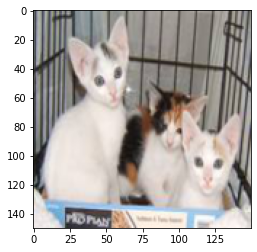

In [ ]:
plt.imshow(pic.permute(1, 2, 0))

## Layer Visulization



Visulizing the intermidiate outputs of CNN layers gives 
a view into how an input is decomposed unto the different filters learned by the network. These outputs(aka feature map) we want to visualize have 3 
dimensions: \[channels, width, height\]. Each channel encodes relatively independent features, so the proper way to visualize these 
feature maps is by independently plotting the contents of every channel, as a 2D image.
Let's start by loading the VGG 16 model with pre-trained weights:

In [ ]:
VGG_model = models.vgg16(pretrained=True).cuda()
print(VGG_model)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

Note that we don't need to chage the multi-calss classifier to binary classifier because we only care the outputs of CNN layers not the model outputs. For demonstration, we will only extract the outputs of the (0)CNN layer, (5)CNN layer and (19)CNN layer:

In [ ]:
# save layer output
layer_output_1 = None  # save (0) CNN here
layer_output_2 = None  # save (5) CNN here
layer_output_3 = None  # save (19) CNN here

# forward to get layer output
def forward_layer(x, model, cnn_ids):
    # hook funcs:
    # takes three arguments: model: the DL model, input: layer input, layer output
    # hook functions can be registered to layers. When the layer is forwarded, 
    # the hook function will be run.
    def hook1(model, input, output):
        global layer_output_1  # make global variable visiable in the function
        layer_output_1 = output  # save result to global variable
    def hook2(model, input, output):
        global layer_output_2
        layer_output_2 = output
    def hook3(model, input, output):
        global layer_output_3
        layer_output_3 = output
    hooks = [hook1, hook2, hook3]  # save the handlers
    
    # forward pass
    with torch.no_grad():
        # register hooks
        hook_handles = []
        for cur_id, cur_hook in zip(cnn_ids, hooks):
            # register the hook on the layer and save handler
            hook_handles.append(model.features[cur_id].register_forward_hook(cur_hook))
        # pass data
        model(x.cuda())  # forward the data, the hook functions will be run
        # remove hook function
        for cur_hook in hook_handles:
            cur_hook.remove()

In [ ]:
pic, _ = dog_cat_dataset[1]  # retrieve one picture
pic = pic.unsqueeze(0)  # (chnnels, height, width)  -> (num_batchs, height, width)

forward_layer(pic, VGG_model, [0, 5, 19])  # forward

layer_output_1 = layer_output_1.permute(0, 2, 3, 1).cpu().numpy()  # move the data to cpu, and rearrange the picture
print(layer_output_1.shape)                                        # dimensions. The visulization package assumes
layer_output_2 = layer_output_2.permute(0, 2, 3, 1).cpu().numpy()  # (height, width, channels)
print(layer_output_2.shape)
layer_output_3 = layer_output_3.permute(0, 2, 3, 1).cpu().numpy()
print(layer_output_3.shape)

layer_output_imgs_1 = [layer_output_1[0, :, :, i] for i in range(layer_output_1.shape[-1])]  # remove the batch dimension
layer_output_imgs_2 = [layer_output_2[0, :, :, i] for i in range(layer_output_2.shape[-1])]
layer_output_imgs_3 = [layer_output_3[0, :, :, i] for i in range(layer_output_3.shape[-1])]

(1, 150, 150, 64)
(1, 75, 75, 128)
(1, 18, 18, 512)


**Visulization:**

Original picture:

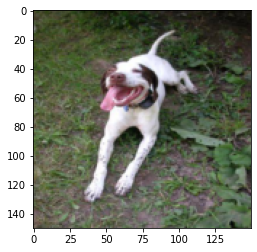

In [ ]:
plt.imshow(pic.permute(0, 2, 3, 1)[0])

(0) CNN Output, the first filter output:

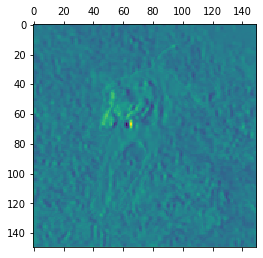

In [ ]:
plt.matshow(layer_output_1[0, :, :, 0], cmap='viridis')
plt.show()

(0) CNN Output: 15the filters

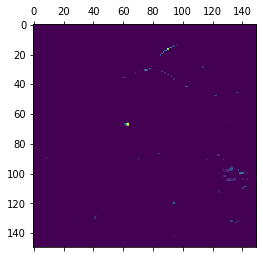

In [ ]:
plt.matshow(layer_output_1[0, :, :, 15], cmap='viridis')
plt.show()

In [ ]:
# show multiple image at the same time
# based on: https://gist.github.com/soply/f3eec2e79c165e39c9d540e916142ae1
def show_images(images, cols = 1):
    n_images = len(images)
    fig = plt.figure()
    for n, image in enumerate(images):
        a = fig.add_subplot(cols, np.ceil(n_images/float(cols)), n + 1)
        a.matshow(image, cmap='viridis')
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_images)
    plt.show()

**(0) CNN Outputs:**

In [ ]:
show_images(layer_output_imgs_1, cols=8)

(5) CNN Outputs(first 64 filters):

In [ ]:
show_images(layer_output_imgs_2[:64], cols=8)

(19) CNN Outputs(first 64 filters):

In [ ]:
show_images(layer_output_imgs_3[:64], cols=8)

We have just evidenced a very important universal characteristic of the representations learned by deep neural networks: the features 
extracted by a layer get increasingly abstract with the depth of the layer. The activations of layers higher-up carry less and less 
information about the specific input being seen, and more and more information about the target (in our case, the class of the image: cat 
or dog). A deep neural network effectively acts as an __information distillation pipeline__, with raw data going in (in our case, RBG 
pictures), and getting repeatedly transformed so that irrelevant information gets filtered out (e.g. the specific visual appearance of the 
image) while useful information get magnified and refined (e.g. the class of the image).

This is analogous to the way humans and animals perceive the world: after observing a scene for a few seconds, a human can remember which 
abstract objects were present in it (e.g. bicycle, tree) but could not remember the specific appearance of these objects. In fact, if you 
tried to draw a generic bicycle from mind right now, chances are you could not get it even remotely right, even though you have seen 
thousands of bicycles in your lifetime. Try it right now: this effect is absolutely real. You brain has learned to completely abstract its 
visual input, to transform it into high-level visual concepts while completely filtering out irrelevant visual details, making it 
tremendously difficult to remember how things around us actually look.

## Filter Explanation

Another easy thing to do to inspect the filters learned by convnets is to display the visual pattern that each filter is meant to respond 
to. This can be done with __gradient ascent in input space__: applying __gradient descent__ to the value of the input image of a convnet so 
as to maximize the response of a specific filter, starting from a blank input image. The resulting input image would be one that the chosen 
filter is maximally responsive to.

Credit to: https://colab.research.google.com/drive/1FbuTOevZTUO3IEVJLwSfwCdGnrBf3Qwv#scrollTo=fGNGiL02Bht4

Model:

In [ ]:
VGG_model = models.vgg16(pretrained=True).cuda()
print(VGG_model)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

Since the input image is a continuous tensor. We use the optimizer on the input image. By calculating the gradient of filter output with respect to the input image and maximizing the filter output on input image, we will be able to know what kind of image will maximize the output of the filter(in other words, what filter see when it is activated).  

The process is very simple:  

1.   Freeze the model weight: we only need the gradient of model outputs with respect the input image.
2.   Get the filter output
3.   Gradient ascent: we will try to find the image that maximize the filter activations, which is done by minimize the negative summation of filter activations(we convert the problem to minimization only because the pytorch optimizer are designed to minimize the loss).




In [ ]:
# normalize image
def normalize(image):
  return (image - image.min()) / (image.max() - image.min())

layer_activations = None  # variable to save activations

def filter_explaination(x, model, cnnid, filterid, iteration=100, lr=1):
    model.eval()  # freeze the weights in the model

    # hook functions
    def hook(model, input, output):
        global layer_activations
        layer_activations = output
  
    hook_handle = model.features[cnnid].register_forward_hook(hook)  # register hook on CNN
    model(x.cuda())  # we only need filter outputs
    filter_activations = layer_activations[:, filterid, :, :].detach().cpu()  # get filter output
    x = x.cuda()
    x.requires_grad_()  # explictly tell pytorh we need gradient of input image
    optimizer = torch.optim.Adam([x], lr=lr)

    for iter in range(iteration):
        model(x)
        objective = -layer_activations[:, filterid, :, :].sum()  # maximize the filter activation to get image
        objective.backward()
        optimizer.step()
        optimizer.zero_grad()

    filter_visualization = x.detach().cpu().squeeze()
    hook_handle.remove()

    return filter_activations, filter_visualization

Please note that we applied the normalizer function here because different image may have different gradient scale. Apply normalization will give us more consistent image output.

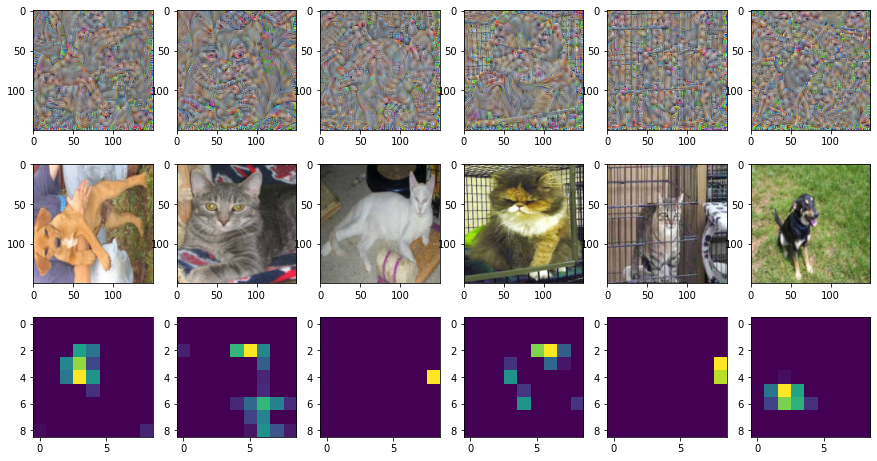

In [ ]:
data_loader = DataLoader(dog_cat_dataset, batch_size=6, shuffle=True)
images, _ = next(data_loader.__iter__())
filter_activations, filter_visualization = filter_explaination(images, VGG_model, cnnid=28, filterid=44, iteration=600, lr=0.01)

fig, axs = plt.subplots(3, len(images), figsize=(15, 8))
for i, img in enumerate(filter_activations):
  axs[0][i].imshow(normalize(img))
for i, img in enumerate(images):
  axs[1][i].imshow(normalize(img.permute(1, 2, 0)))
for i, img in enumerate(filter_visualization):
    axs[2][i].imshow(normalize(img.permute(1, 2, 0)))
plt.show()
plt.close()

## Saliency map

The saliency map is simply a map of gradient of input image with respect to the loss of the output of the model. This gradient can be interperted as \[If the value of a given pixel changed, how large it will affect the loss\]. By generating the saliency map, we would be able to know which pixels are important in determining the output of the model. In othre words, what does the model see on the image.

Credit to: https://colab.research.google.com/drive/1FbuTOevZTUO3IEVJLwSfwCdGnrBf3Qwv#scrollTo=fGNGiL02Bht4

### Model:

In [ ]:
VGG_model = models.vgg16(pretrained=True).cuda()

# define out classifier
binary_classifier = nn.Sequential(
   nn.Linear(in_features=25088, out_features=2048),
   nn.ReLU(),
   nn.Linear(in_features=2048, out_features=1024),
   nn.ReLU(),
   nn.Linear(in_features=1024, out_features=512),
   nn.ReLU(),
   nn.Linear(in_features=512, out_features=1)
)

# replace model class classifier attribute:
VGG_model.classifier = binary_classifier

print(VGG_model)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

### Train:

In [ ]:
def train_model(model, train_dataset, test_dataset, device, 
                lr=0.0001, epochs=30, batch_size=256):
    
    # construct dataloader
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    # move model to device
    model = model.to(device)

    # history
    history = {'train_loss': [],
               'train_acc': [],
               'test_loss': [],
               'test_acc': []}
    # setup loss function and optimizer
    criterion = nn.BCEWithLogitsLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    # training loop
    print('Training Start')
    for epoch in range(epochs):
        model.train()
        train_loss = 0
        train_acc = 0
        test_loss = 0
        test_acc = 0
        
        for x, y in train_loader:
            # move data to device
            x = x.to(device)
            y = y.to(device)
            # forward
            outputs = model(x).view(-1)  # (num_batch)
            cur_train_loss = criterion(outputs, y)
            pred = torch.sigmoid(outputs)
            pred = torch.round(pred)
            cur_train_acc = (pred == y).sum().item() / batch_size
            # backward
            cur_train_loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            # loss and acc
            train_loss += cur_train_loss
            train_acc += cur_train_acc

        # test start
        model.eval()
        with torch.no_grad():
            for x, y in test_loader:
                # move
                x = x.to(device)
                y = y.to(device)
                # predict
                outputs = model(x).view(-1)
                pred = torch.round(torch.sigmoid(outputs))
                cur_test_loss = criterion(outputs, y)
                cur_test_acc = (pred == y).sum().item() / batch_size 
                # loss and acc
                test_loss += cur_test_loss
                test_acc += cur_test_acc

        # epoch output
        train_loss = (train_loss/len(train_loader)).item()
        train_acc = train_acc/len(train_loader)
        val_loss = (test_loss/len(test_loader)).item()
        val_acc = test_acc/len(test_loader)
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['test_loss'].append(val_loss)
        history['test_acc'].append(val_acc)
        print(f"Epoch:{epoch + 1} / {epochs}, train loss:{train_loss:.4f} train_acc:{train_acc:.4f}, valid loss:{val_loss:.4f} valid acc:{val_acc:.4f}")
    
    return history

In [ ]:
split_size = (np.array([0.8, 0.2]) * len(dog_cat_dataset)).round().astype(np.int)
train_data, valid_data = random_split(dog_cat_dataset, split_size)

In [ ]:
train_model(VGG_model, train_data, valid_data, device, batch_size=32, epochs=4, lr=0.000001)

Training Start
Epoch:1 / 4, train loss:0.4793 train_acc:0.8613, valid loss:0.1831 valid acc:0.9366
Epoch:2 / 4, train loss:0.1265 train_acc:0.9541, valid loss:0.0919 valid acc:0.9571
Epoch:3 / 4, train loss:0.0804 train_acc:0.9710, valid loss:0.0924 valid acc:0.9580
Epoch:4 / 4, train loss:0.0614 train_acc:0.9766, valid loss:0.0656 valid acc:0.9679


{'test_acc': [0.9366071428571429,
  0.9571428571428572,
  0.9580357142857143,
  0.9678571428571429],
 'test_loss': [0.18307442963123322,
  0.09193892776966095,
  0.09240413457155228,
  0.06563245505094528],
 'train_acc': [0.8612859712230215,
  0.954136690647482,
  0.970998201438849,
  0.9766187050359713],
 'train_loss': [0.4793298542499542,
  0.1264779418706894,
  0.08037159591913223,
  0.06138411909341812]}

### Saliency_maps

In [ ]:
def normalize(image):
  return (image - image.min()) / (image.max() - image.min())

def compute_saliency_maps(x, y, model):
    model.eval()  # freeze the weight
    x = x.cuda()

    x.requires_grad_()  # we need to calculate the grad of input image
  
    y_pred = model(x).view(-1)
    loss_func = nn.BCEWithLogitsLoss()
    loss = loss_func(y_pred, y.cuda())
    loss.backward()  # gradient of loss with respect to input image

    saliencies = x.grad.abs().detach().cpu()
    saliencies = torch.stack([normalize(item) for item in saliencies])
    # apply normalization again because different image may have different gradient scale

    return saliencies

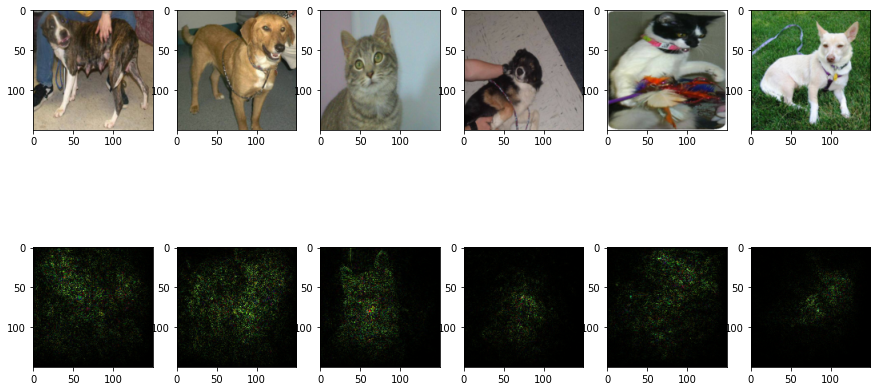

In [ ]:
data_loader = DataLoader(dog_cat_dataset, batch_size=6, shuffle=True)
images, labels = next(data_loader.__iter__())
saliencies = compute_saliency_maps(images, labels, VGG_model)

# plot
fig, axs = plt.subplots(2, len(images), figsize=(15, 8))
for row, target in enumerate([images, saliencies]):
  for column, img in enumerate(target):
    axs[row][column].imshow(img.permute(1, 2, 0).numpy())

plt.show()
plt.close()